In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from sklearn.model_selection import train_test_split, GroupShuffleSplit
import tensorflow as tf
import pandas as pd
import cv2
import pickle

# Import utility functions
import sys
sys.path.append('.')  # Ensure the current directory is in the path
from jsrt_utils import read_img_file, load_mask, resize_img, plot_image_with_masks, plot_with_attention_mask, load_clinical_data

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Data paths
BASE_DIR = "data"
IMAGE_DIR = os.path.join(BASE_DIR, "images")
MASK_DIR = os.path.join(BASE_DIR, "segmentation_masks")
MASK_SUBDIRS = ['heart', 'left_clavicle', 'left_lung', 'right_clavicle', 'right_lung']

# Output dimensions for resizing
IMG_HEIGHT = 512
IMG_WIDTH = 512
NUM_CLASSES = 2  # Binary classification (nodule vs non-nodule)

In [ ]:
def create_improved_nodule_attention_masks(img_shape, nodule_coords, radius=64):
    h, w = img_shape
    n_samples = len(nodule_coords)
    attention_masks = np.zeros((n_samples, h, w, 1), dtype=np.float32)
    
    # Create meshgrid for the entire image once
    y_grid, x_grid = np.mgrid[:h, :w]
    
    for i, coords in enumerate(nodule_coords):
        if coords is not None:
            # Scale coordinates to match resized images
            x, y = coords
            x_scaled = int(x * w / 2048)
            y_scaled = int(y * h / 2048)
            
            # Calculate squared distance from center
            dist_from_center = (x_grid - x_scaled)**2 + (y_grid - y_scaled)**2
            
            # Create Gaussian falloff mask
            sigma = radius / 2  # Controls the spread
            gaussian_mask = np.exp(-dist_from_center / (2 * sigma**2))
            
            # Normalize to [0, 1]
            gaussian_mask = gaussian_mask / np.max(gaussian_mask)
            
            # Threshold low values for cleaner mask
            gaussian_mask[gaussian_mask < 0.05] = 0
            
            # Assign to the attention mask
            attention_masks[i, :, :, 0] = gaussian_mask
    
    return attention_masks

In [3]:
def prepare_dataset():
    """Prepare the dataset using actual nodule labels from clinical data."""
    # Get all image file paths
    img_files = glob(os.path.join(IMAGE_DIR, "*.IMG"))
    
    # Arrays to store data
    X = []  # Images
    Y = []  # Labels
    masks = []  # Segmentation masks
    ids = []  # Image IDs
    nodule_coords = []  # Nodule coordinates (for nodule images)
    
    # Load clinical data
    nodule_data, non_nodule_data = load_clinical_data(BASE_DIR)
    
    print(f"Loaded clinical data: {len(nodule_data)} nodule images, {len(non_nodule_data)} non-nodule images")
    
    # Process each image
    for img_file in img_files:
        # Extract the image ID (filename without extension)
        img_id = os.path.basename(img_file).split('.')[0]
        ids.append(img_id)
        
        # Read and preprocess the image
        img = read_img_file(img_file)
        if img is not None:
            img = resize_img(img, (IMG_WIDTH, IMG_HEIGHT))
            X.append(img)
            
            # Load the segmentation mask
            mask = load_mask(img_id, MASK_DIR, MASK_SUBDIRS)
            masks.append(mask)
            
            # Get the label from clinical data
            if img_id in nodule_data:
                Y.append(1)  # Nodule present
                nodule_coords.append((nodule_data[img_id]['x_coord'], nodule_data[img_id]['y_coord']))
            elif img_id in non_nodule_data:
                Y.append(0)  # No nodule
                nodule_coords.append(None)
            else:
                print(f"Warning: No clinical data found for {img_id}, using default label 0")
                Y.append(0)
                nodule_coords.append(None)
    
    # Convert lists to numpy arrays
    X = np.array(X)
    Y = np.array(Y)
    masks = np.array(masks)
    
    # Add a channel dimension to the images if they don't have one
    if len(X.shape) == 3:
        X = X[..., np.newaxis]
    
    # Create attention masks based on nodule coordinates with Gaussian falloff
    attention_masks = create_improved_nodule_attention_masks(
        img_shape=(IMG_HEIGHT, IMG_WIDTH),
        nodule_coords=nodule_coords
    )
    
    return X, Y, masks, ids, nodule_coords, attention_masks

Loading and preparing the dataset...
Loaded clinical data: 154 nodule images, 93 non-nodule images
Displaying examples:


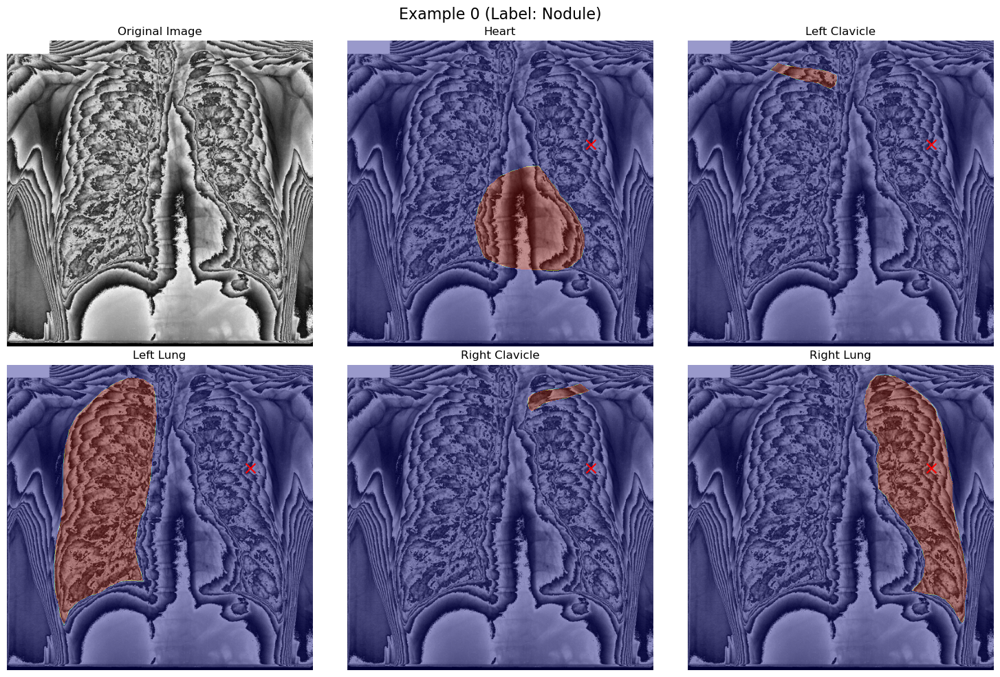

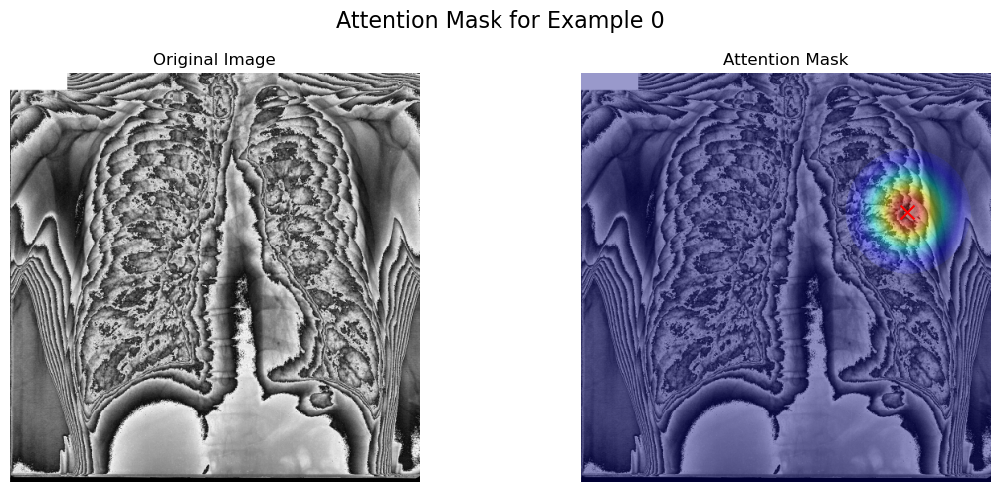

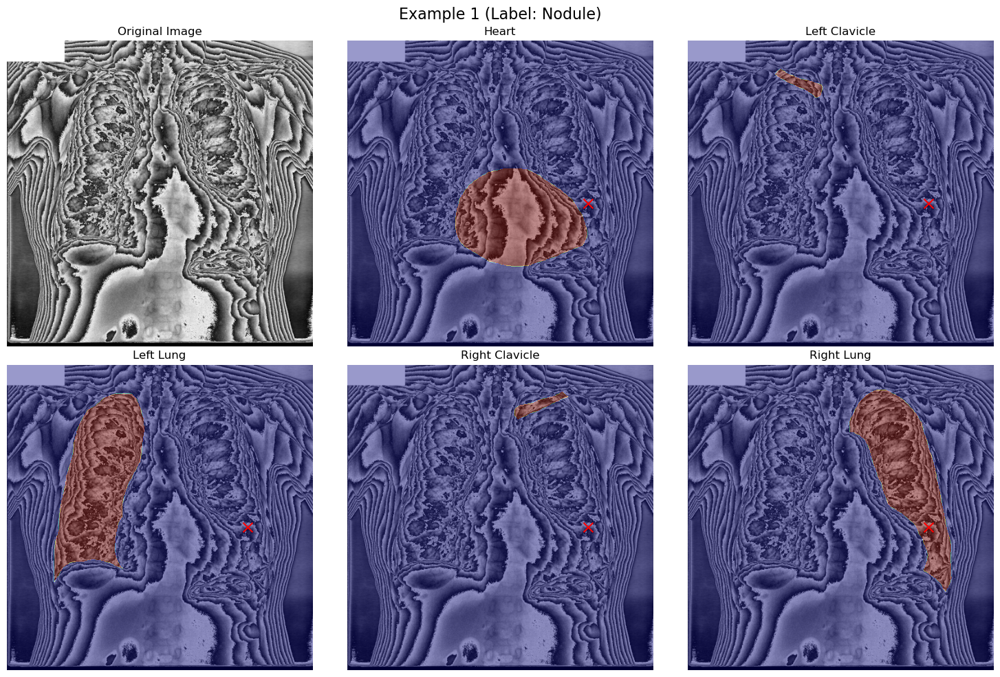

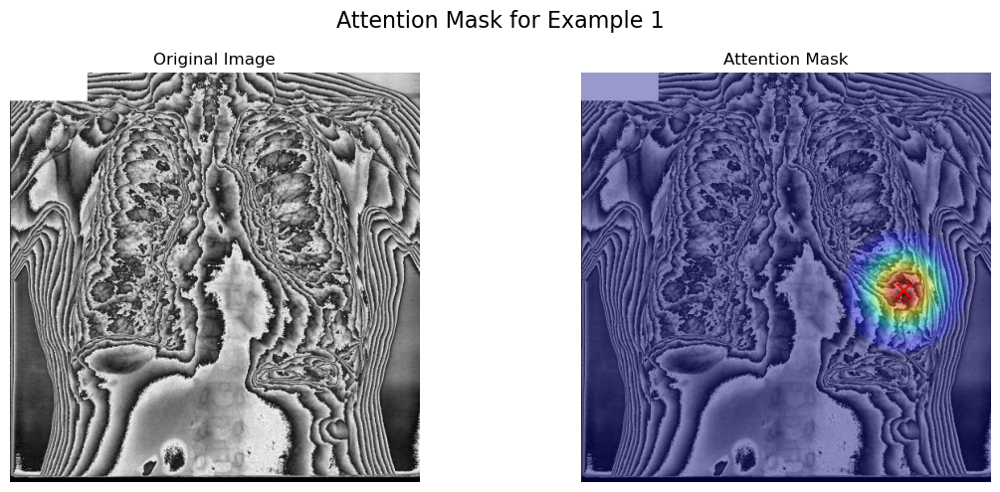

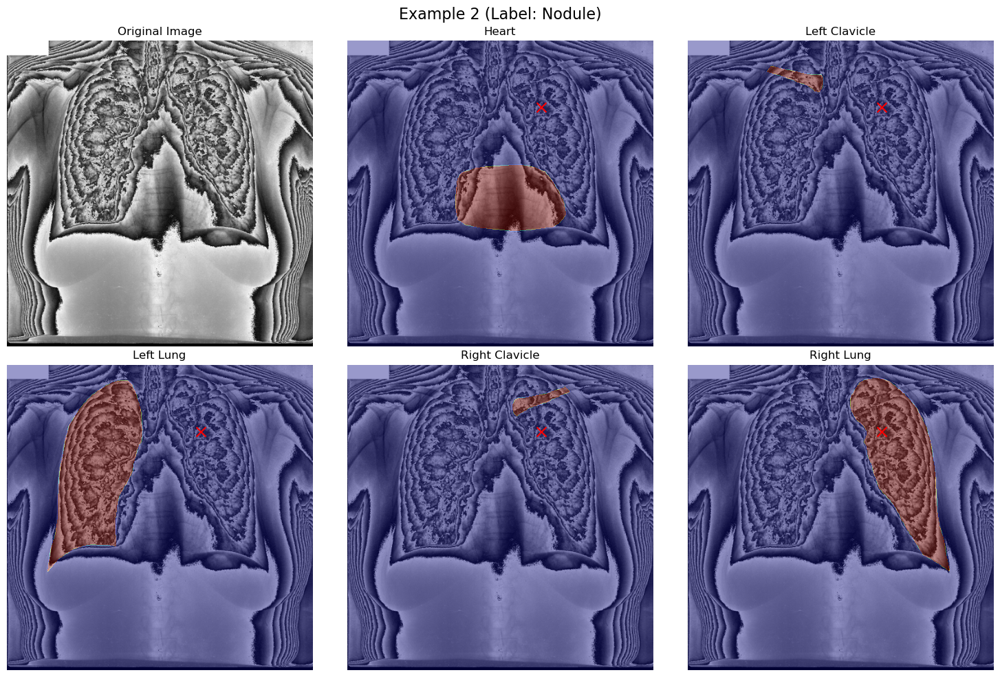

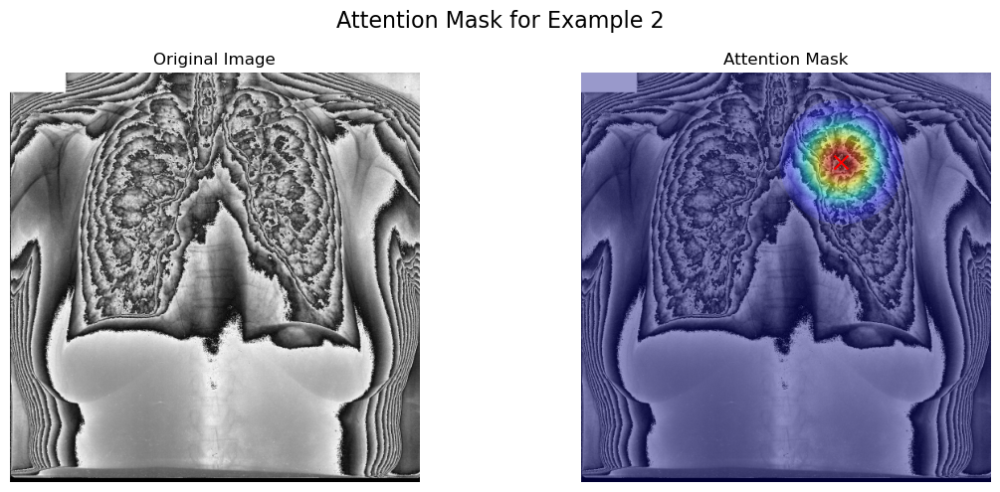

In [4]:
# Display the first few examples with nodule information
def plot_examples(X, Y, masks, nodule_coords, attention_masks, n=3):
    """Plot n examples of images, their masks, nodule locations, and attention masks."""
    # Look for examples with nodules for better visualization
    nodule_indices = np.where(Y == 1)[0]
    display_indices = nodule_indices[:min(n, len(nodule_indices))]
    
    for idx in display_indices:
        # Plot image with masks and nodule location
        plot_image_with_masks(
            X[idx].squeeze(), 
            masks[idx], 
            title=f"Example {idx} (Label: {'Nodule' if Y[idx] == 1 else 'Non-nodule'})",
            nodule_coords=nodule_coords[idx]
        )
        
        # Plot image with attention mask
        plot_with_attention_mask(
            X[idx].squeeze(),
            attention_masks[idx],
            title=f"Attention Mask for Example {idx}",
            nodule_coords=nodule_coords[idx]
        )

# Load and prepare the dataset
print("Loading and preparing the dataset...")
X, Y, masks, ids, nodule_coords, attention_masks = prepare_dataset()

# Plot a few examples
print("Displaying examples:")
plot_examples(X, Y, masks, nodule_coords, attention_masks)


Verifying data integrity:
NaN values in images: False
NaN values in masks: False
NaN values in attention masks: False
Image data range: 0.0000 to 1.0000
Mask data range: 0.0000 to 1.0000
Attention mask range: 0.0000 to 1.0000
Class distribution: 93 non-nodules, 153 nodules
Class balance: 62.2% nodules
Number of unique patients: 246 (from 246 images)


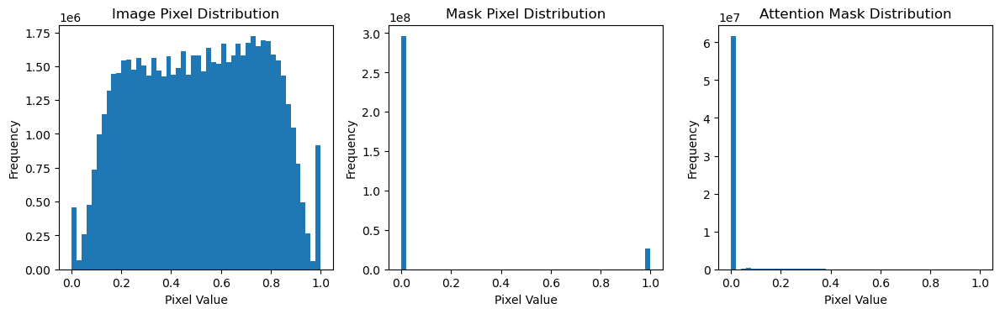

True

In [5]:
def verify_data_integrity(X, Y, masks, attention_masks, ids):
    """Perform basic data integrity checks."""
    print("\nVerifying data integrity:")
    
    # Check for NaN values
    print(f"NaN values in images: {np.isnan(X).any()}")
    print(f"NaN values in masks: {np.isnan(masks).any()}")
    print(f"NaN values in attention masks: {np.isnan(attention_masks).any()}")
    
    # Check data ranges
    print(f"Image data range: {X.min():.4f} to {X.max():.4f}")
    print(f"Mask data range: {masks.min():.4f} to {masks.max():.4f}")
    print(f"Attention mask range: {attention_masks.min():.4f} to {attention_masks.max():.4f}")
    
    # Check data distribution
    print(f"Class distribution: {np.sum(Y == 0)} non-nodules, {np.sum(Y == 1)} nodules")
    print(f"Class balance: {np.sum(Y == 1)/len(Y)*100:.1f}% nodules")
    
    # Check patient distribution
    print(f"Number of unique patients: {len(set(ids))} (from {len(ids)} images)")
    
    # Create histogram of pixels
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 3, 1)
    plt.hist(X.flatten(), bins=50)
    plt.title('Image Pixel Distribution')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    
    plt.subplot(1, 3, 2)
    plt.hist(masks.flatten(), bins=50)
    plt.title('Mask Pixel Distribution')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    
    plt.subplot(1, 3, 3)
    plt.hist(attention_masks.flatten(), bins=50)
    plt.title('Attention Mask Distribution')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    return True

# Verify data integrity
verify_data_integrity(X, Y, masks, attention_masks, ids)

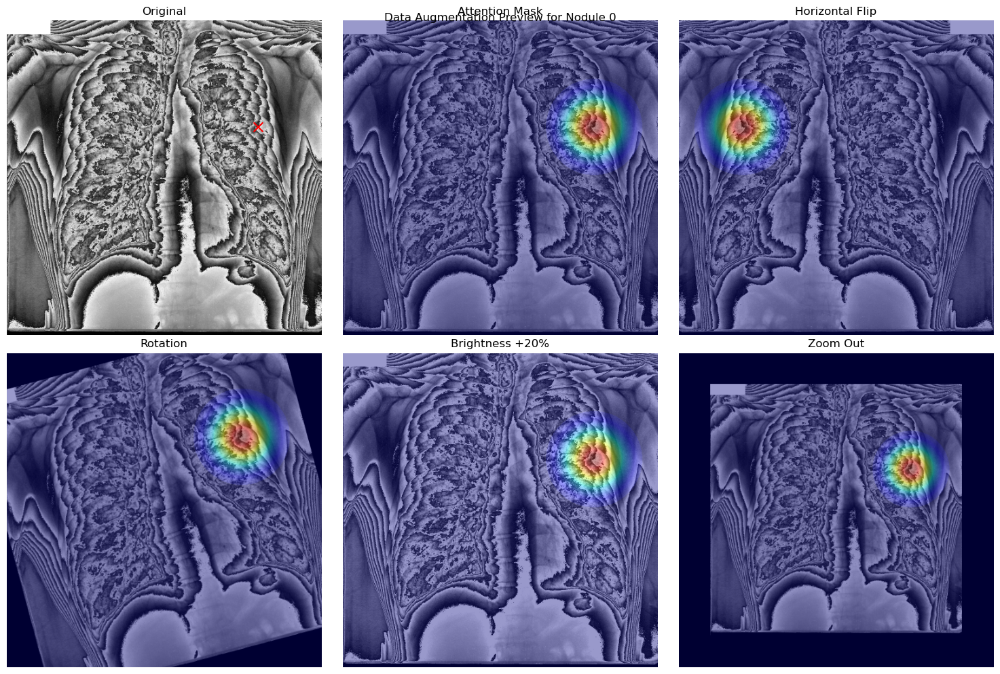

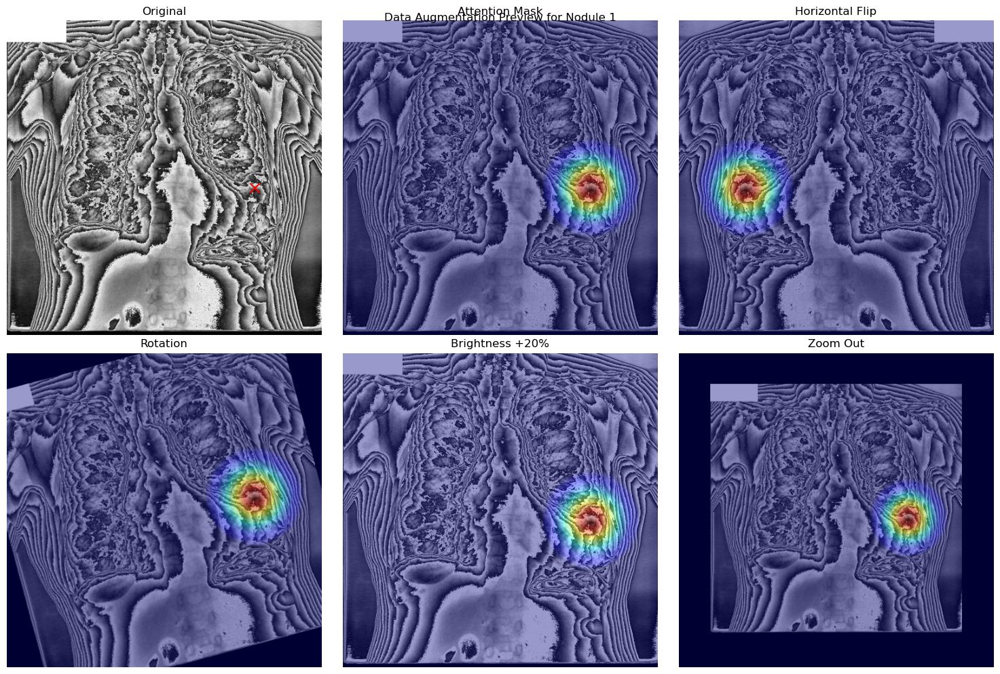

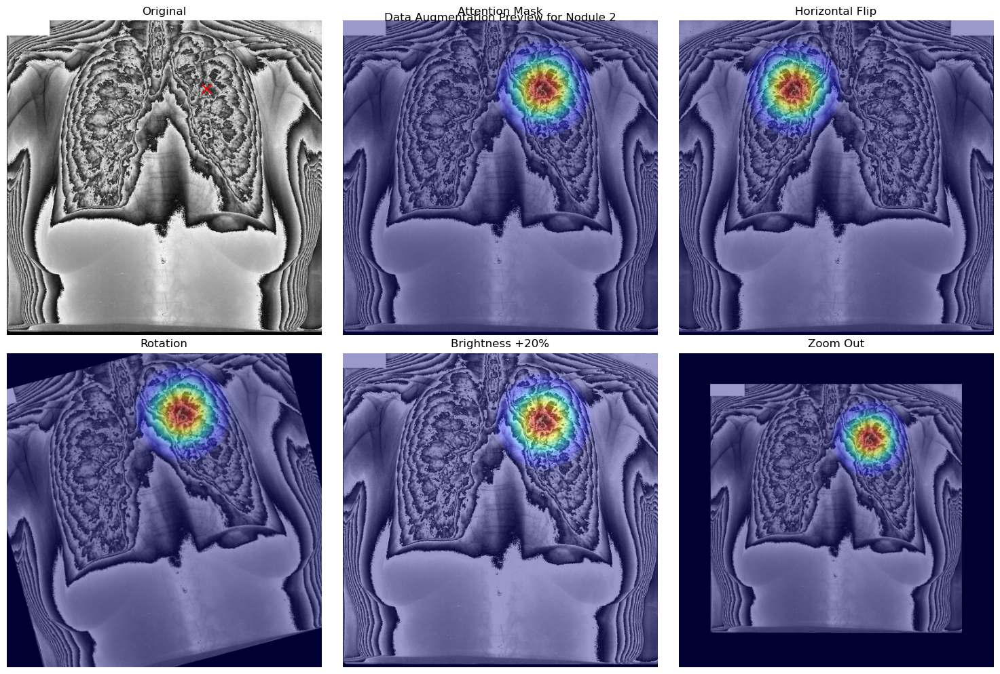

In [6]:
def preview_augmentations(X, Y, nodule_coords, attention_masks):
    """Preview data augmentation effects on nodule images"""
    # Get a few nodule examples
    nodule_indices = np.where(Y == 1)[0][:3]
    
    for idx in nodule_indices:
        img = X[idx]
        attention = attention_masks[idx]
        coords = nodule_coords[idx]
        
        # Apply different augmentations
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        
        # Original
        axes[0, 0].imshow(img.squeeze(), cmap='gray')
        axes[0, 0].set_title('Original')
        if coords:
            x, y = coords
            x_scaled = int(x * img.shape[1] / 2048)
            y_scaled = int(y * img.shape[0] / 2048)
            axes[0, 0].scatter(x_scaled, y_scaled, c='red', marker='x', s=100)
        
        # Show attention
        axes[0, 1].imshow(img.squeeze(), cmap='gray')
        axes[0, 1].imshow(attention.squeeze(), cmap='jet', alpha=0.4)
        axes[0, 1].set_title('Attention Mask')
        
        # Augmentation 1: Horizontal flip
        img_aug = np.fliplr(img.copy()).squeeze()
        att_aug = np.fliplr(attention.copy()).squeeze()
        axes[0, 2].imshow(img_aug, cmap='gray')
        axes[0, 2].imshow(att_aug, cmap='jet', alpha=0.4)
        axes[0, 2].set_title('Horizontal Flip')
        
        # Augmentation 2: Rotation
        angle = 15
        M = cv2.getRotationMatrix2D((img.shape[1]//2, img.shape[0]//2), angle, 1)
        img_aug = cv2.warpAffine(img.squeeze(), M, (img.shape[1], img.shape[0]))
        att_aug = cv2.warpAffine(attention.squeeze(), M, (attention.shape[1], attention.shape[0]))
        axes[1, 0].imshow(img_aug, cmap='gray')
        axes[1, 0].imshow(att_aug, cmap='jet', alpha=0.4)
        axes[1, 0].set_title('Rotation')
        
        # Augmentation 3: Brightness adjustment
        img_aug = np.clip(img.squeeze() * 1.2, 0, 1)
        axes[1, 1].imshow(img_aug, cmap='gray')
        axes[1, 1].imshow(attention.squeeze(), cmap='jet', alpha=0.4)
        axes[1, 1].set_title('Brightness +20%')
        
        # Augmentation 4: Zoom
        zoom = 0.8
        h, w = img.shape[:2]
        new_h, new_w = int(h * zoom), int(w * zoom)
        start_h, start_w = (h - new_h) // 2, (w - new_w) // 2
        img_temp = np.zeros_like(img.squeeze())
        att_temp = np.zeros_like(attention.squeeze())
        img_temp[start_h:start_h+new_h, start_w:start_w+new_w] = cv2.resize(img.squeeze(), (new_w, new_h))
        att_temp[start_h:start_h+new_h, start_w:start_w+new_w] = cv2.resize(attention.squeeze(), (new_w, new_h))
        axes[1, 2].imshow(img_temp, cmap='gray')
        axes[1, 2].imshow(att_temp, cmap='jet', alpha=0.4)
        axes[1, 2].set_title('Zoom Out')
        
        for ax in axes.flatten():
            ax.axis('off')
            
        plt.tight_layout()
        plt.suptitle(f'Data Augmentation Preview for Nodule {idx}', y=0.98)
        plt.show()

# Preview data augmentations
preview_augmentations(X, Y, nodule_coords, attention_masks)

In [7]:
# Split data into training and validation sets using patient groups
print("Performing patient-aware train/validation split...")

# First create array of patient IDs
ids_array = np.array(ids)

# Use GroupShuffleSplit to ensure patients don't overlap between train and validation
gss = GroupShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
train_idx, val_idx = next(gss.split(X, Y, groups=ids_array))

# Get train and validation sets
X_train, X_val = X[train_idx], X[val_idx]
Y_train, Y_val = Y[train_idx], Y[val_idx]
masks_train, masks_val = masks[train_idx], masks[val_idx]
attention_train, attention_val = attention_masks[train_idx], attention_masks[val_idx]

# Get patient and image IDs for each set
ids_train = [ids[i] for i in train_idx]
ids_val = [ids[i] for i in val_idx]

# Get nodule coordinates
coords_train = [nodule_coords[i] for i in train_idx]
coords_val = [nodule_coords[i] for i in val_idx]

print(f"Train/Val Split Results:")
print(f"  Training: {X_train.shape[0]} samples (Nodules: {np.sum(Y_train == 1)}, Non-nodules: {np.sum(Y_train == 0)})")
print(f"  Validation: {X_val.shape[0]} samples (Nodules: {np.sum(Y_val == 1)}, Non-nodules: {np.sum(Y_val == 0)})")
print(f"  Image shape: {X_train.shape[1:]}")
print(f"  Mask shape: {masks_train.shape[1:]}")
print(f"  Attention mask shape: {attention_train.shape[1:]}")

# Verify no patient overlap
train_patients = set(ids_train)
val_patients = set(ids_val)
overlap = train_patients.intersection(val_patients)
print(f"Patient overlap between train and val: {len(overlap)} patients")
assert len(overlap) == 0, "Error: Patients found in both train and validation sets!"

# Save the prepared dataset
np.save(os.path.join(BASE_DIR, "X_train.npy"), X_train)
np.save(os.path.join(BASE_DIR, "Y_train.npy"), Y_train)
np.save(os.path.join(BASE_DIR, "masks_train.npy"), masks_train)
np.save(os.path.join(BASE_DIR, "attention_train.npy"), attention_train)
np.save(os.path.join(BASE_DIR, "X_val.npy"), X_val)
np.save(os.path.join(BASE_DIR, "Y_val.npy"), Y_val)
np.save(os.path.join(BASE_DIR, "masks_val.npy"), masks_val)
np.save(os.path.join(BASE_DIR, "attention_val.npy"), attention_val)

# Save image and patient IDs
np.save(os.path.join(BASE_DIR, "ids_train.npy"), np.array(ids_train))
np.save(os.path.join(BASE_DIR, "ids_val.npy"), np.array(ids_val))

# Save nodule coordinates as pickle files (since they contain None values)
with open(os.path.join(BASE_DIR, "coords_train.pkl"), 'wb') as f:
    pickle.dump(coords_train, f)
with open(os.path.join(BASE_DIR, "coords_val.pkl"), 'wb') as f:
    pickle.dump(coords_val, f)

print("Dataset saved to disk.")

Performing patient-aware train/validation split...
Train/Val Split Results:
  Training: 123 samples (Nodules: 74, Non-nodules: 49)
  Validation: 123 samples (Nodules: 79, Non-nodules: 44)
  Image shape: (512, 512, 1)
  Mask shape: (512, 512, 5)
  Attention mask shape: (512, 512, 1)
Patient overlap between train and val: 0 patients
Dataset saved to disk.
